# Visualization

by Yuqing Wang, Jiaming Lai

In [106]:
import numpy as np 
import pandas as pd
import matplotlib.pyplot as plt
%matplotlib inline

from pylab import *
import geopandas as gpd
import seaborn as sns
import folium
from folium.plugins import MarkerCluster
from folium import plugins

from wordcloud import WordCloud,STOPWORDS
import plotly.express as px

import warnings 
warnings.filterwarnings("ignore", category=FutureWarning)

In [107]:
# Image save path
import os
save_path = "save/visualization/"
# Create save folder
if not os.path.exists(save_path):
    os.makedirs(save_path)
# Set sns themec
# plt.style.use('ggplot')
sns.set_theme(style="whitegrid")

In [108]:
# Create a pandas dataframe of the Airbnb data
data = pd.read_csv('dataset/AB_NYC_2019.csv')
data.head(5)

,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
0,2539,Clean & quiet apt home by the park,2787,John,Brooklyn,Kensington,40.64749,-73.97237,Private room,149,1,9,2018-10-19,0.21,6,365
1,2595,Skylit Midtown Castle,2845,Jennifer,Manhattan,Midtown,40.75362,-73.98377,Entire home/apt,225,1,45,2019-05-21,0.38,2,355
2,3647,THE VILLAGE OF HARLEM....NEW YORK !,4632,Elisabeth,Manhattan,Harlem,40.80902,-73.94190,Private room,150,3,0,NaN,NaN,1,365
3,3831,Cozy Entire Floor of Brownstone,4869,LisaRoxanne,Brooklyn,Clinton Hill,40.68514,-73.95976,Entire home/apt,89,1,270,2019-07-05,4.64,1,194
4,5022,Entire Apt: Spacious Studio/Loft by central park,7192,Laura,Manhattan,East Harlem,40.79851,-73.94399,Entire home/apt,80,10,9,2018-11-19,0.10,1,0


In [109]:
# Review the data information
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 48895 entries, 0 to 48894
Data columns (total 16 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   id                              48895 non-null  int64  
 1   name                            48879 non-null  object 
 2   host_id                         48895 non-null  int64  
 3   host_name                       48874 non-null  object 
 4   neighbourhood_group             48895 non-null  object 
 5   neighbourhood                   48895 non-null  object 
 6   latitude                        48895 non-null  float64
 7   longitude                       48895 non-null  float64
 8   room_type                       48895 non-null  object 
 9   price                           48895 non-null  int64  
 10  minimum_nights                  48895 non-null  int64  
 11  number_of_reviews               48895 non-null  int64  
 12  last_review                     

In [110]:
data.describe()

,id,host_id,latitude,longitude,price,minimum_nights,number_of_reviews,reviews_per_month,calculated_host_listings_count,availability_365
count,4.889500e+04,4.889500e+04,48895.000000,48895.000000,48895.000000,48895.000000,48895.000000,38843.000000,48895.000000,48895.000000
mean,1.901714e+07,6.762001e+07,40.728949,-73.952170,152.720687,7.029962,23.274466,1.373221,7.143982,112.781327
std,1.098311e+07,7.861097e+07,0.054530,0.046157,240.154170,20.510550,44.550582,1.680442,32.952519,131.622289
min,2.539000e+03,2.438000e+03,40.499790,-74.244420,0.000000,1.000000,0.000000,0.010000,1.000000,0.000000
25%,9.471945e+06,7.822033e+06,40.690100,-73.983070,69.000000,1.000000,1.000000,0.190000,1.000000,0.000000
50%,1.967728e+07,3.079382e+07,40.723070,-73.955680,106.000000,3.000000,5.000000,0.720000,1.000000,45.000000
75%,2.915218e+07,1.074344e+08,40.763115,-73.936275,175.000000,5.000000,24.000000,2.020000,2.000000,227.000000
max,3.648724e+07,2.743213e+08,40.913060,-73.712990,10000.000000,1250.000000,629.000000,58.500000,327.000000,365.000000


In [111]:
data.isnull().sum()

id                                    0
name                                 16
host_id                               0
host_name                            21
neighbourhood_group                   0
neighbourhood                         0
latitude                              0
longitude                             0
room_type                             0
price                                 0
minimum_nights                        0
number_of_reviews                     0
last_review                       10052
reviews_per_month                 10052
calculated_host_listings_count        0
availability_365                      0
dtype: int64

## Data Clean

1. Drop 'host_name', 'last_review' and 'reviews_per_month'

In [112]:
# data['reviews_per_month'].fillna(value = 0 , inplace = True)
data.drop(['host_name' ,'last_review', 'reviews_per_month'] , axis = 1 , inplace = True)
data.head()

,id,name,host_id,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,calculated_host_listings_count,availability_365
0,2539,Clean & quiet apt home by the park,2787,Brooklyn,Kensington,40.64749,-73.97237,Private room,149,1,9,6,365
1,2595,Skylit Midtown Castle,2845,Manhattan,Midtown,40.75362,-73.98377,Entire home/apt,225,1,45,2,355
2,3647,THE VILLAGE OF HARLEM....NEW YORK !,4632,Manhattan,Harlem,40.80902,-73.94190,Private room,150,3,0,1,365
3,3831,Cozy Entire Floor of Brownstone,4869,Brooklyn,Clinton Hill,40.68514,-73.95976,Entire home/apt,89,1,270,1,194
4,5022,Entire Apt: Spacious Studio/Loft by central park,7192,Manhattan,East Harlem,40.79851,-73.94399,Entire home/apt,80,10,9,1,0


## Plot numerical distribution

In [113]:
def remove_extreme(df,attribute):
    assert isinstance(attribute,str)
    Q1 = df[attribute].quantile(0.25)
    Q3 = df[attribute].quantile(0.75)
    IQR = Q3-Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    df_filtered = df[(df[attribute] > lower_bound) & (df[attribute]< upper_bound)]
    return df_filtered[attribute]

In [114]:
name_space = ['latitude', 'longitude', 'price', 
              'minimum_nights', 'number_of_reviews', 'availability_365']

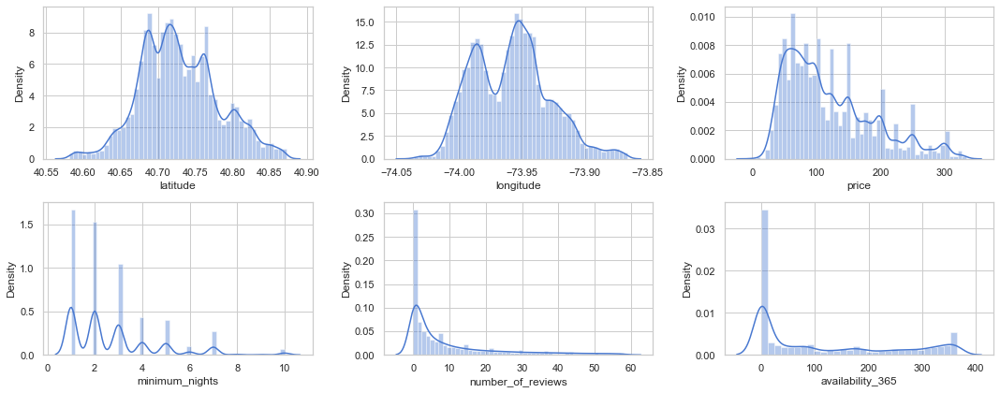

In [115]:
sns.set_palette("muted")
f, ax = plt.subplots(figsize=(15, 6))
counter = 1
for name in name_space:
    filtered_result = remove_extreme(data, name)
    subplot(2,3,counter)
    sns.distplot(filtered_result)
    counter += 1
plt.tight_layout() # avoid overlap of plots
plt.savefig(os.path.join(save_path, "plot_numerical_distribution_1.png"), dpi=100)

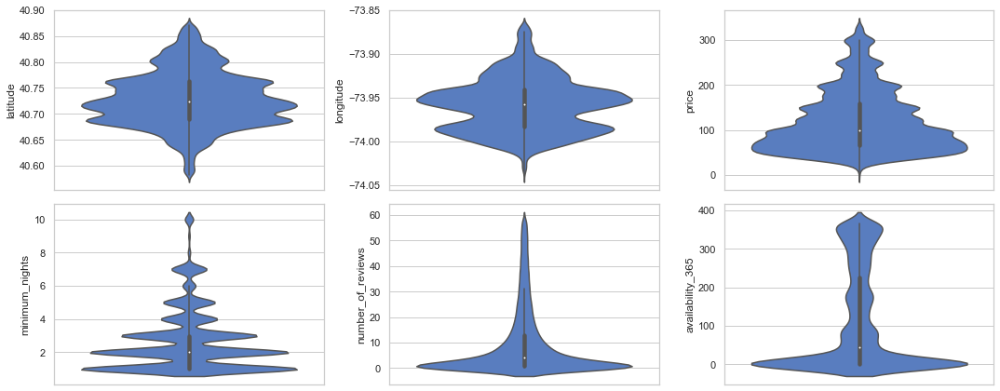

In [116]:
sns.set_palette("muted")
f, ax = plt.subplots(figsize=(15, 6))
counter = 1
for name in name_space:
    filtered_result = remove_extreme(data, name)
    subplot(2,3,counter)
    sns.violinplot(y=filtered_result)
    counter += 1
plt.tight_layout() # avoid overlap of plots
plt.savefig(os.path.join(save_path, "plot_numerical_distribution_2.png"), dpi=100)

### Inference

We notice that price has Poisson distribution.

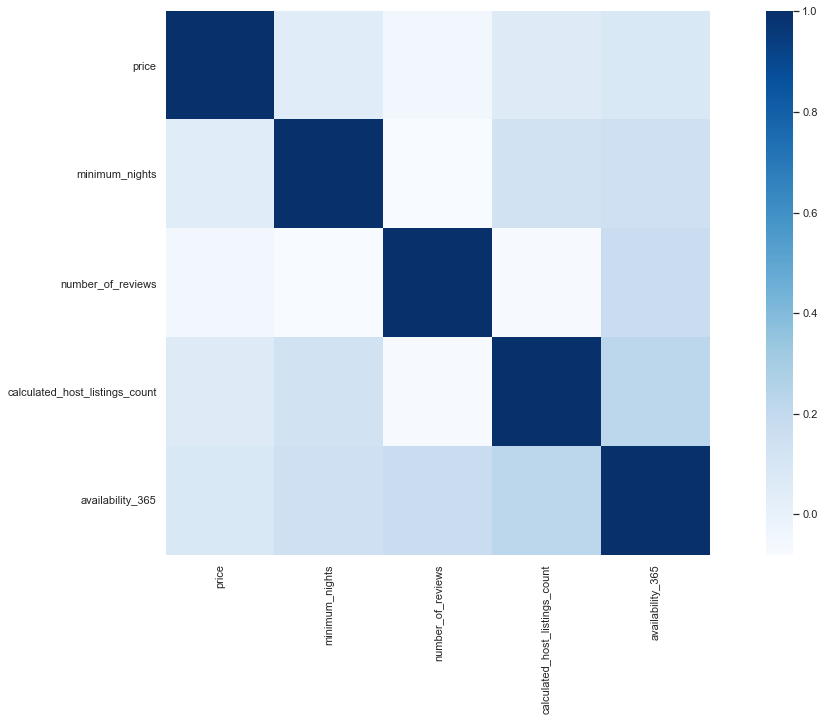

In [117]:
plt.figure(figsize=(20,10))
sns.heatmap(data.drop(['id','host_id','latitude','longitude'] , axis = 1 ).corr(), square=True, cmap='Blues')
# plt.title('Correlation matrix of numerical variables')
plt.savefig(os.path.join(save_path, "plot_correlation_matrix.png"), dpi=100)

## Plot geographical distribution

(-0.5, 2650.5, 2592.5, -0.5)

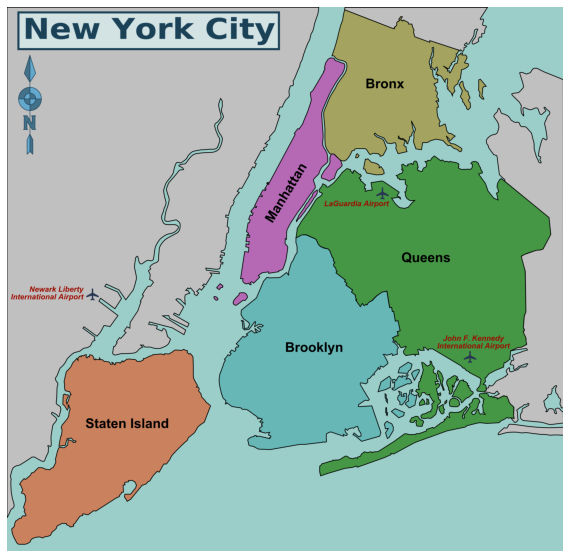

In [118]:
plt.figure(figsize=(10,10))
img = plt.imread('dataset/New_York_City_District_Map.png')
plt.imshow(img)
plt.axis('off')

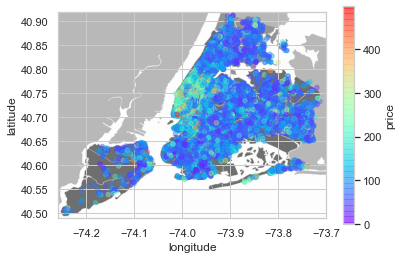

In [120]:
#creating a sub-dataframe with no extreme values / less than 500
sub_data = data[data.price < 500]
# plt.figure(figsize=(10,10))
img = plt.imread('dataset/New_York_City_.png.jpeg')
plt.imshow(img, zorder=0, extent=[-74.258, -73.7, 40.49,40.92])
ax=plt.gca()
sub_data.plot(kind='scatter', x='longitude', y='latitude', c='price', ax=ax, 
              cmap=plt.get_cmap('rainbow'), colorbar=True, alpha=0.4, zorder=5)
plt.savefig(os.path.join(save_path, "plot_heatmap_1.png"), dpi=100)
plt.show()

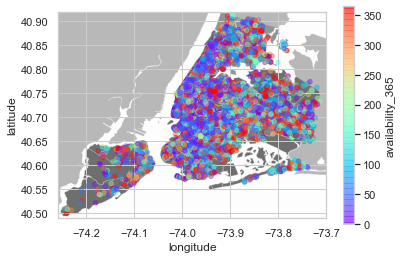

In [121]:
# plt.figure(figsize=(10,10))
plt.imshow(img, zorder=0, extent=[-74.258, -73.7, 40.49,40.92])
ax=plt.gca()
sub_data.plot(kind='scatter', x='longitude', y='latitude', c="availability_365", ax=ax, 
              cmap=plt.get_cmap('rainbow'), colorbar=True, alpha=0.4, zorder=5)
plt.savefig(os.path.join(save_path, "plot_heatmap_2.png"), dpi=100)
plt.show()

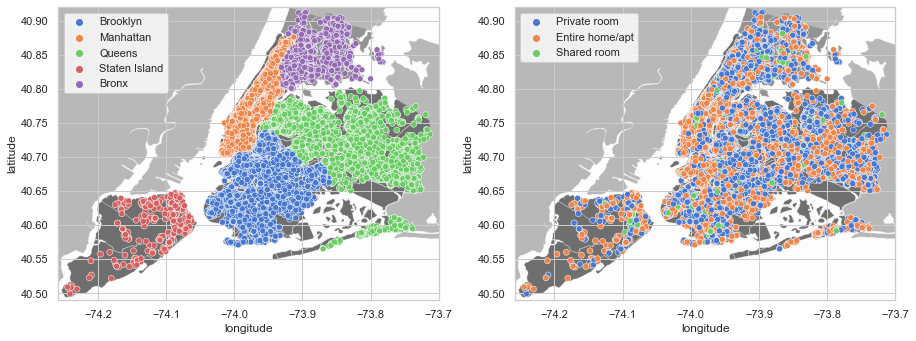

In [122]:
plt.figure(figsize = (15, 12))
name_space = ["neighbourhood_group", "room_type"]
counter = 1
for name in name_space:
    plt.subplot(2, 2, counter)
    plt.imshow(img, zorder=0, extent=[-74.258, -73.7, 40.49,40.92])
    sns.scatterplot(x="longitude", y="latitude",hue=name, data=sub_data)
    plt.legend(loc='upper left')
    counter += 1
plt.savefig(os.path.join(save_path, "plot_heatmap_3.png"), dpi=100)

### Inference

From the price heatmap, we could see that Manhattan has higher density of high-price Airbnb houses.

## Plot neighbourhood group

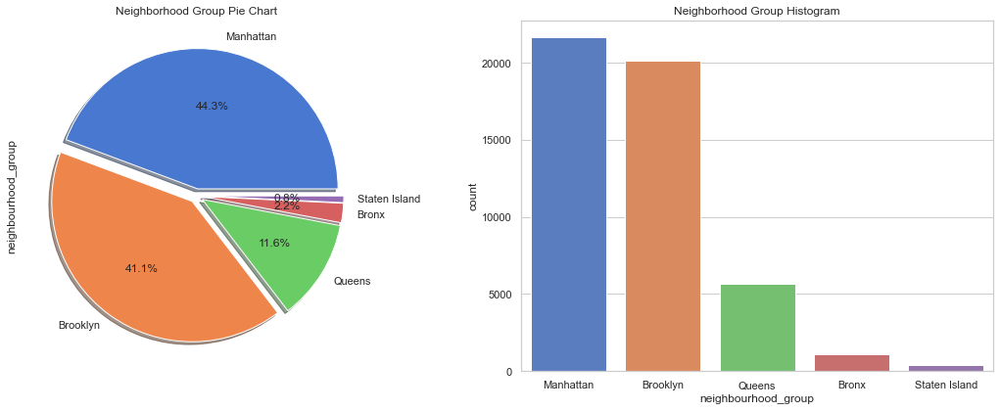

In [123]:
f,ax = plt.subplots(1, 2, figsize=(15,6))
data['neighbourhood_group'].value_counts().plot.pie(explode=[0.05,0.05,0.05,0.05,0.05],
                                                    autopct='%1.1f%%', ax=ax[0], shadow=True)
ax[0].set_title('Neighborhood Group Pie Chart')
# ax[0].set_ylabel('Neighborhood Group Share')

sns.countplot('neighbourhood_group',data=data,ax=ax[1],order=data['neighbourhood_group'].value_counts().index)
ax[1].set_title('Neighborhood Group Histogram')
plt.tight_layout() # avoid overlap of plots
plt.savefig(os.path.join(save_path, "plot_count_neighbourhood_group.png"), dpi=100)

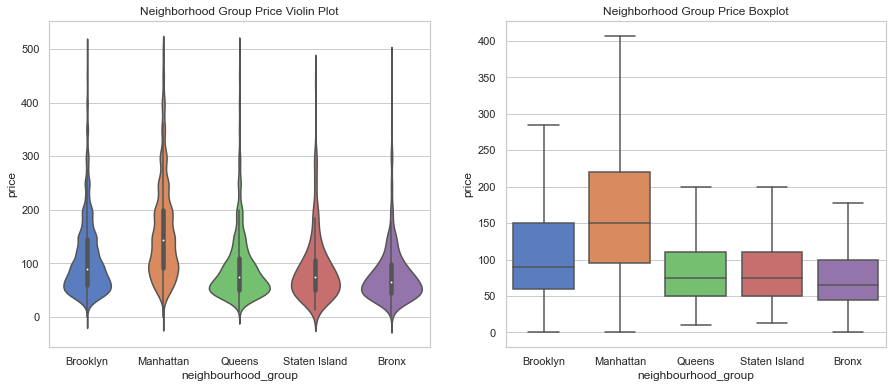

In [124]:
plt.figure(figsize=(15, 6))
sub_data = data[data.price < 500]
plt.subplot(1, 2, 1)
viz_2 = sns.violinplot(data=sub_data, x='neighbourhood_group', y='price')
viz_2.set_title('Neighborhood Group Price Violin Plot')
plt.subplot(1, 2, 2)
sns.boxplot(x='neighbourhood_group', y='price', data=data, showfliers = False)
plt.title('Neighborhood Group Price Boxplot')
plt.savefig(os.path.join(save_path, "plot_price_neighberhood_group.png"), dpi=100)

### Inference

1. Manhatten and Brooklyn have the highest share of rooms.
2. Manhattan has highest housing price median, while Queens has the lowest.

In [125]:
# plt.figure(figsize=(10,6))
# sns.distplot(data[data.neighbourhood_group=='Manhattan'].price,kde_kws=dict(linewidth=3), hist=False,label='Manhattan')
# sns.distplot(data[data.neighbourhood_group=='Brooklyn'].price,kde_kws=dict(linewidth=3),hist=False,label='Brooklyn')
# sns.distplot(data[data.neighbourhood_group=='Queens'].price,kde_kws=dict(linewidth=3), hist=False,label='Queens')
# sns.distplot(data[data.neighbourhood_group=='Staten Island'].price,kde_kws=dict(linewidth=3), hist=False,label='Staten Island')
# sns.distplot(data[data.neighbourhood_group=='Long Island'].price,kde_kws=dict(linewidth=3), hist=False,label='Long Island')
# plt.legend()
# # plt.title('Price destribution per Neighborhood Group where Price < 1000')
# plt.xlim(0,1000)

## Plot room type

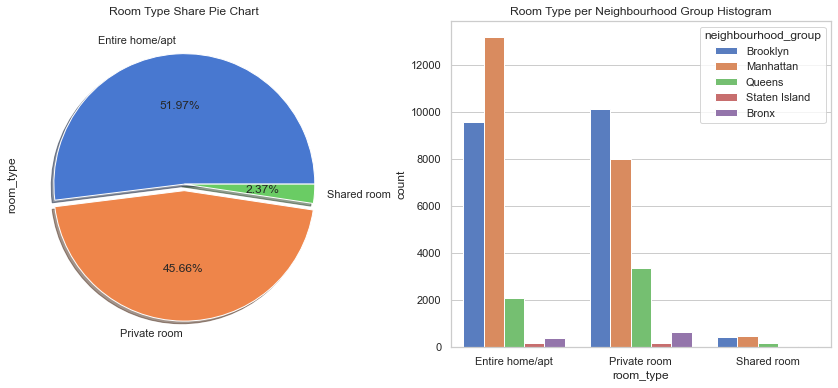

In [126]:
f,ax = plt.subplots(1,2,figsize=(15, 6))
count = data['room_type'].value_counts()
count.plot.pie(explode=[0,0.05,0],autopct='%1.2f%%',ax=ax[0],shadow=True)
ax[0].set_title('Room Type Share Pie Chart')

sns.countplot(x = 'room_type',hue = "neighbourhood_group", data=data,ax=ax[1],order = count.index)
ax[1].set_title('Room Type per Neighbourhood Group Histogram')
plt.savefig(os.path.join(save_path, "plot_room_neighberhood_group.png"), dpi=100)
plt.show()

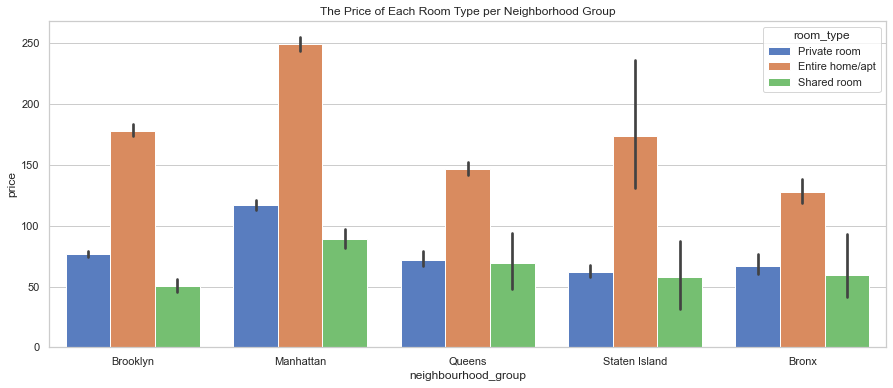

In [127]:
plt.figure(figsize=(15, 6))
sns.barplot(x = "neighbourhood_group", y = "price", hue = "room_type",data = data)
plt.title("The Price of Each Room Type per Neighborhood Group")
plt.savefig(os.path.join(save_path, "plot_room_price_neighberhood_group.png"), dpi=100)
plt.show()

### Inference 

1. Manhattan has more apartments or entire home, while Brooklyn has more private room.
2. Entire home apartment has highest share followed by private room and least prefered is shared room. This may because people prefer traveling within a group. Very few people opt for shared spaces, probably due to lack of privacy. People in Staten island seldom book through airbnb
2. The average price of different room type varies in different neighbourhood group.

## Plot host listings count

Each host has a different number of properties listed on the Airbnb website. This attribute is called 'calculated_host_listings_count'. 

In [128]:
def remove_extreme(df,attribute):
    assert isinstance(attribute,str)
    lower_bound = df[attribute].quantile(0.01)
    upper_bound = df[attribute].quantile(0.93)
    df_filtered = df[(df[attribute] > lower_bound) & (df[attribute]< upper_bound)]
    return df_filtered[attribute]
filtered_calculated_host_listings_count = remove_extreme(data, 'calculated_host_listings_count')

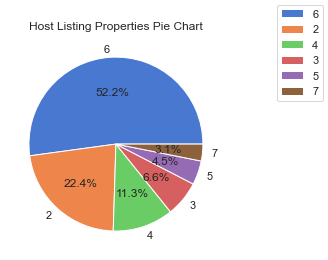

In [129]:
labels = filtered_calculated_host_listings_count.unique()
sizes = filtered_calculated_host_listings_count.value_counts()*100
fig, ax = plt.subplots()
ax.pie(sizes, labels = labels, autopct = '%1.1f%%')
ax.set_title('Host Listing Properties Pie Chart')
fig.legend(labels=labels)
plt.savefig(os.path.join(save_path, "plot_host_listing_count.png"), dpi=100)

### Inference

Almost half host have six properties listed  on Airbnb. 20% host have two properties listed on Airbnb. 10% host have four properties listed on Airbnb

## Plot number of rooms

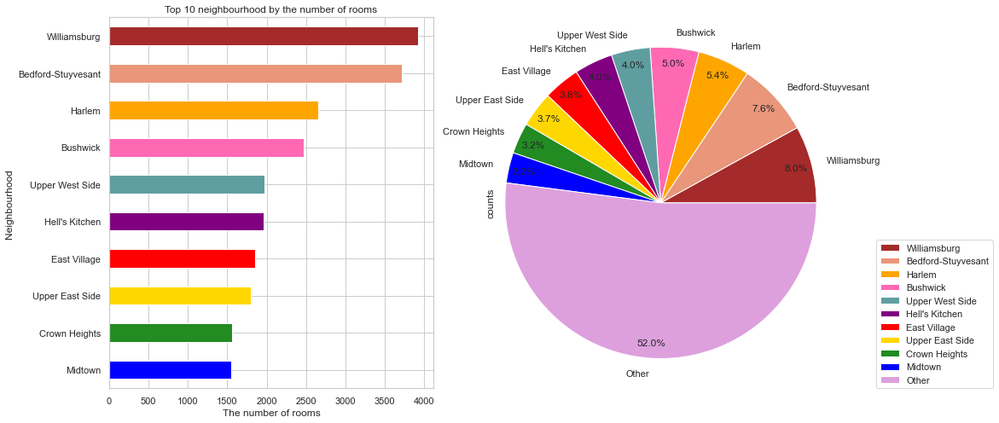

In [130]:
fig,ax = plt.subplots(1,2,figsize=(15,8))
count = data['neighbourhood'].value_counts()
clr = ("blue", "forestgreen", "gold", "red", "purple",'cadetblue','hotpink','orange','darksalmon','brown')
count.sort_values(ascending=False)[:10].sort_values().plot(kind='barh', color=clr,ax=ax[0])
ax[0].set_title("Top 10 neighbourhood by the number of rooms")
ax[0].set_xlabel('The number of rooms')
ax[0].set_ylabel('Neighbourhood ')


groups = list(count.index)[:10]
counts = list(count[:10])
counts.append(count.agg(sum)-count[:10].agg('sum'))
groups.append('Other')
type_dict=pd.DataFrame({"group":groups,"counts":counts})
clr1=('brown','darksalmon','orange','hotpink','cadetblue','purple','red','gold','forestgreen','blue','plum')
qx = type_dict.plot(kind='pie', y='counts', labels=groups,colors=clr1,autopct='%1.1f%%', pctdistance=0.9, radius=1.2,ax=ax[1])
plt.legend(loc=0, bbox_to_anchor=(1.15,0.4)) 
# plt.subplots_adjust(wspace =0.5, hspace =0)
plt.savefig(os.path.join(save_path, "plot_room_number_neighbourhood.png"), dpi=100)

Williamsburg, Bedford-Stuyvesant and Hariem have highest number of rooms.

Text(0.5, 1.0, 'The Neighborhood with the top 10 mean price')

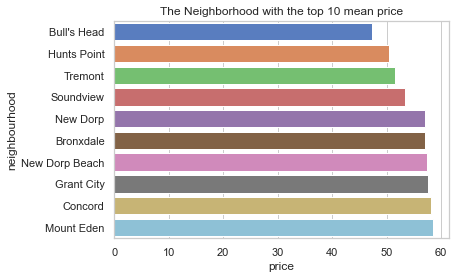

In [131]:
data_top_prices_by_neighbourhood = data.groupby('neighbourhood').agg({'price': 'mean'}).sort_values('price').reset_index()
sns.barplot(y="neighbourhood", x="price", data=data_top_prices_by_neighbourhood.head(10))
plt.title("The Neighborhood with the top 10 mean price")

Use groupby to group two columns neighbourhood and price, and explore their relationships.

We can see for the top 10 neighbourhoods the mean price is in the range 45 to 57 dollars. Mount Eden,Concord and Grant have higher mean prices. Bulls Head, Hunts Point and Tremont are the neighbourhoods with least price in this case.


The top neighbourhoods are differnt when sorting by mean and maximum Prices. 

Text(0.5, 1.0, 'The Neighborhood with the top 10 max price')

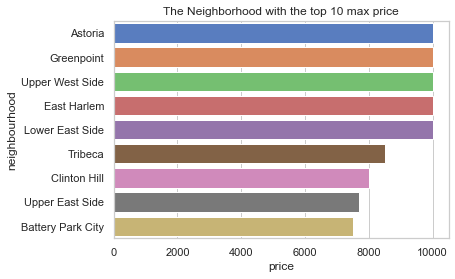

In [132]:
sns.barplot(y="neighbourhood", x="price", data=data.nlargest(10,['price']))
plt.title("The Neighborhood with the top 10 max price")

## Word Cloud 

Word Cloud  is a data visualization technique used for representing text data in which the size of each word indicates its frequency or importance. Significant textual data points can be highlighted using a word cloud.

The name of the listed property will influence whether users choose the property or not. We will explore the most frequent words that appear in the name of the property. 

In [133]:
def make_wordcloud(words):
    text = ""
    for word in words:
        text = text + " " + word

    stopwords = set(STOPWORDS)
    word_cloud = WordCloud(width = 1000,
                       height = 800,
                       colormap='Pastel1',
                       margin = 0,
                       max_words = 300,  
                       max_font_size = 300, min_font_size = 20,  
                       background_color = "salmon",contour_width = 3).generate(text)
    plt.figure(figsize=(20,20))
    plt.imshow(word_cloud, interpolation="gaussian")
    plt.axis("off")
    plt.show()

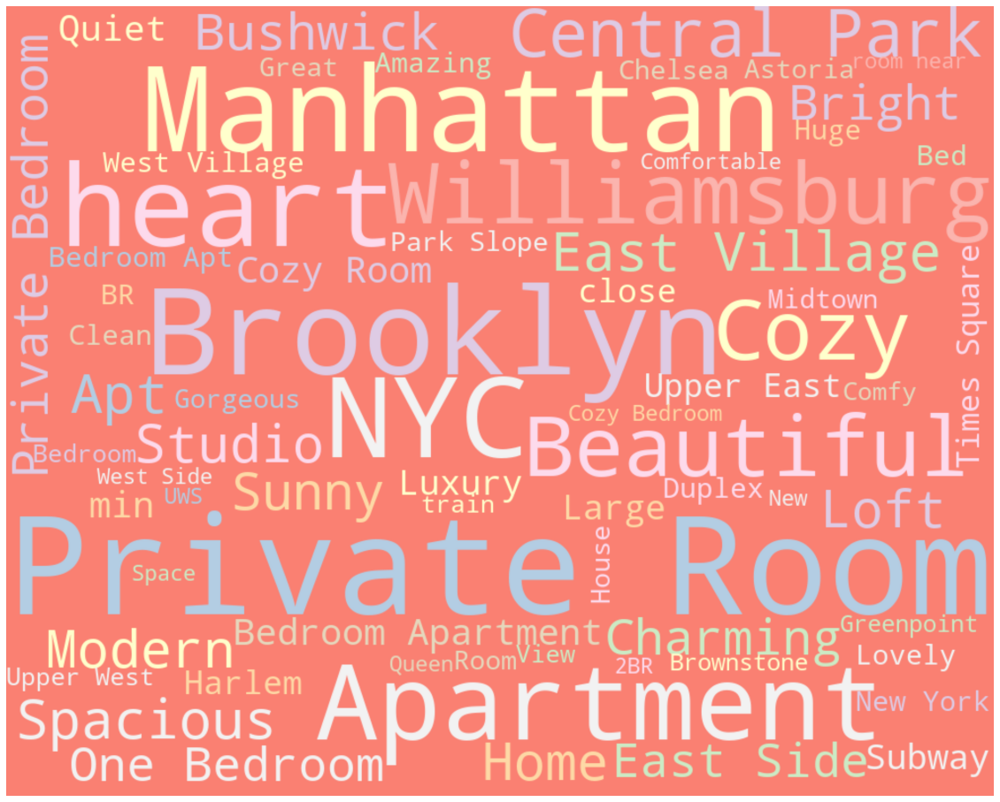

In [134]:
# Remove missing values in the 'name' attribute
names = data['name'].dropna()
make_wordcloud(names)

Find words appear frequently in the top 1000 luxurious airbnbs.

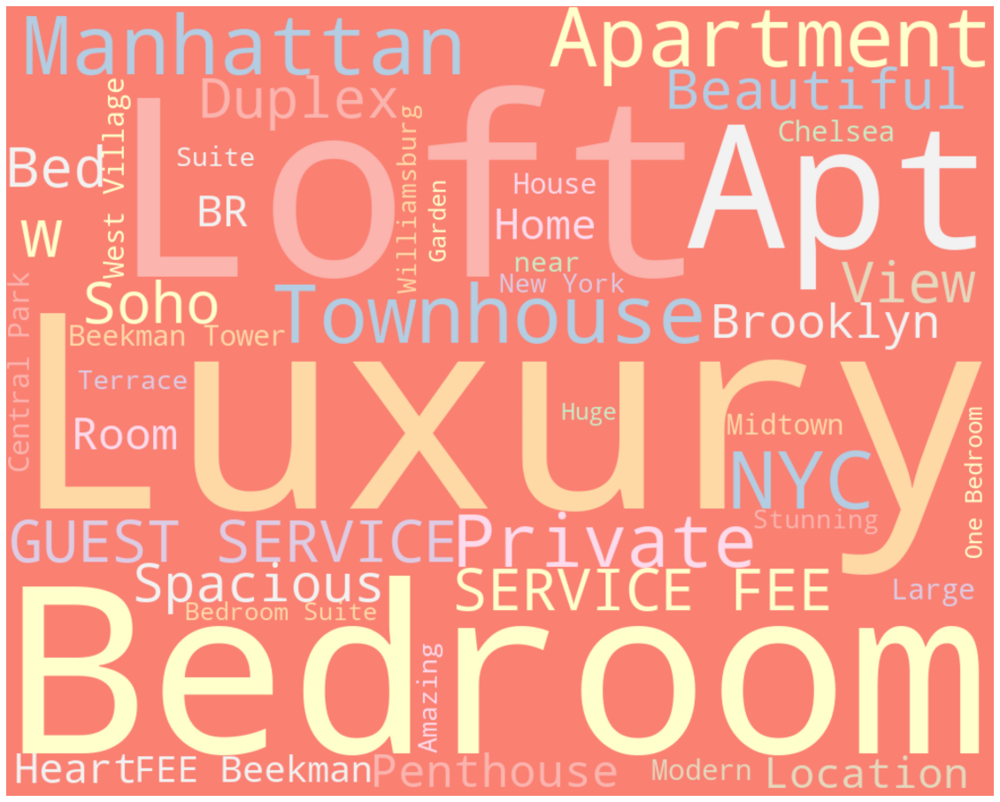

In [135]:
# Most expensive Airbnbs 
expensive = data.sort_values(by = 'price', ascending = False)

# Storing the names of the 1000 luxurious airbnbs in New York in a separate variable
luxury = expensive.head(1000)

names = luxury['name'].dropna()
make_wordcloud(names)

The **folium** package makes it easy to visualize data that’s been manipulated in Python on an interactive leaflet map. 

We visualize the listed rooms with the most number of reviews. After clicking on the specific room, the user can see the name of the room

In [136]:
number_of_reviews_top = data.sort_values(by=['number_of_reviews'],ascending=False).head(1000)
print ("The interactive map showing 1000 listed rooms with the most number of reviews")

NYC_COORDINATES = ( 40.71, -74.00)
# create empty map zoomed in on New York City
map = folium.Map(location=NYC_COORDINATES, zoom_start=12)
tooltip = "Click me!"

# add a marker for every record in the filtered data, use a clustered view
map_rooms_map = plugins.MarkerCluster().add_to(map)

for lat,lon,name in zip(number_of_reviews_top.latitude,number_of_reviews_top.longitude,number_of_reviews_top.name):
    folium.Marker(location=[lat,lon],icon = folium.Icon(icon='home'), popup = name, tooltip=tooltip).add_to(map_rooms_map)
map.add_child(map_rooms_map)

map

The interactive map showing 1000 listed rooms with the most number of reviews


We visualize the listed rooms with the highest price. After clicking on the specific room, the user can see the name of the room.

In [137]:
price_top = data.sort_values(by=['price'],ascending=False).head(1000)
print ("The interactive map showing 1000 listed rooms with the highest price")

NYC_COORDINATES = ( 40.71, -74.00)
# create empty map zoomed in on New York City
price_map = folium.Map(location=NYC_COORDINATES, zoom_start=12)
tooltip = "Click me!"

# add a marker for every record in the filtered data, use a clustered view
map_price_map = plugins.MarkerCluster().add_to(map)

for lat,lon,name in zip(number_of_reviews_top.latitude,number_of_reviews_top.longitude,number_of_reviews_top.name):
    folium.Marker(location=[lat,lon],icon = folium.Icon(icon='home'), popup = name, tooltip=tooltip).add_to(map_price_map)
    
price_map.add_child(map_price_map)

price_map

The interactive map showing 1000 listed rooms with the highest price


Look at the top 10 hosts in NYC and see where they are hosting in NYC.

Use Plotly's Python graphing library makes interactive graph

In [138]:
# Set up a scatter plot on a tile map
fig = px.scatter_mapbox(data, 
                        hover_data = ['price','minimum_nights','room_type','number_of_reviews'],
                        hover_name = 'neighbourhood',
                        lat="latitude", 
                        lon="longitude", 
                        color="neighbourhood_group", 
                        size="price",
                        color_continuous_scale = px.colors.cyclical.Twilight, 
                        size_max = 20, 
                        opacity = .60,
                        zoom=10)
fig.layout.mapbox.style = 'open-street-map'
fig.update_layout(title_text = 'Classify listed rooms by neighborhood group in NYC<br>(Click legend to toggle borough)', height = 400)
fig.show()

<ipython-input-139-da487c678f5c>:15: MatplotlibDeprecationWarning:

The 's' parameter of annotate() has been renamed 'text' since Matplotlib 3.3; support for the old name will be dropped two minor releases later.



(905464.7390380859, 1075092.8783935546, 112485.76063504722, 280480.4142594267)

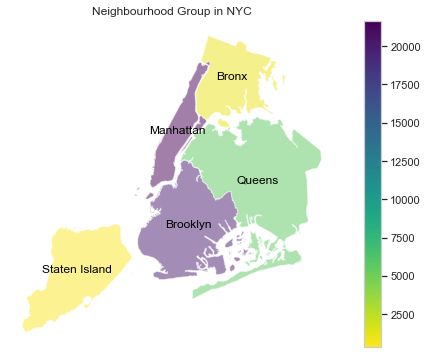

In [139]:
# Bring in a base layer of NYC boroughs
nyc = gpd.read_file(gpd.datasets.get_path('nybb'))

# Group by neighbourhood group 
neighbourhood_group_count = data.groupby('neighbourhood_group').agg('count').reset_index()

# Rename the column to boroname, so that we can join the data to it on a common field
nyc.rename(columns={'BoroName':'neighbourhood_group'}, inplace=True)
neighbourhood_group_geo = nyc.merge(neighbourhood_group_count, on='neighbourhood_group')

#Plot the count by neighbourhood_group into a map
fig,ax = plt.subplots(1,1,figsize=(10,6))

neighbourhood_group_geo.plot(column='id', cmap='viridis_r', alpha=.5, ax=ax, legend=True)
neighbourhood_group_geo.apply(lambda x: ax.annotate(s=x.neighbourhood_group, color='black', xy=x.geometry.centroid.coords[0],ha='center'), axis=1)
plt.title("Neighbourhood Group in NYC")
plt.axis('off')